In [10]:
from torch.utils.data import Dataset
import torch
import math, tifffile, os, time
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob
import tifffile as tiff
import os
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim
import pandas as pd
from pathlib import Path
import nd2
from ipywidgets import interact, IntSlider, widgets
from ipywidgets import interactive_output
from scipy.ndimage import center_of_mass
from scipy.ndimage import gaussian_filter
from moviepy import ImageSequenceClip
from IPython.display import display, Image
from array2gif import write_gif

In [2]:
with open("access.txt", "r", encoding="utf-8") as file:
    content = [line.strip() for line in file]

In [3]:
Path(content[0])

PosixPath('/Volumes/TAYLOR-LAB/Huyen_Anh')

In [5]:
imagefolders = [folder for folder in Path(content[0]).iterdir() if folder.is_dir()]

In [6]:
nd2_files = {}

for folder in range(len(imagefolders)):
    for _, file in enumerate(imagefolders[folder].glob("*.nd2")):
        nd2_files[folder] = nd2.imread(file)

In [7]:
dark_400 = tiff.imread("images/20210531 Darkfield 400ms.tif").astype(np.float32)
dark_60 = tiff.imread("images/20210531 Darkfield 60ms.tif").astype(np.float32)

In [8]:
nd2_files[0].shape

(451, 3, 600, 600)

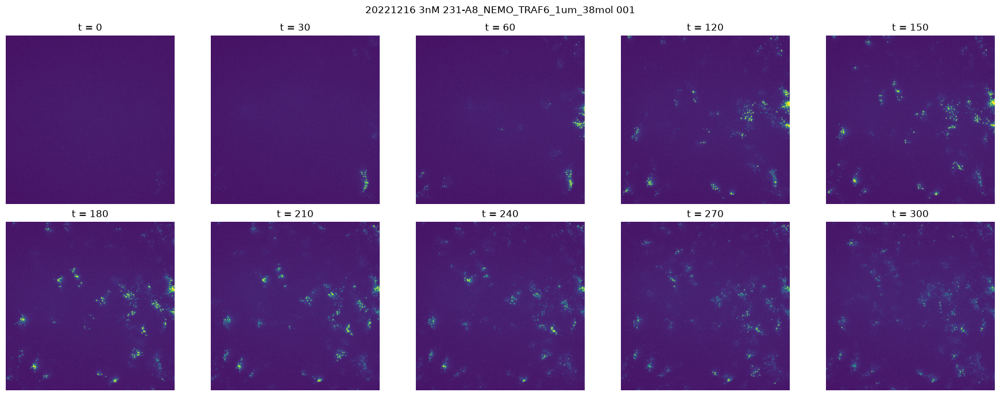

MoviePy - Building file 20221216 3nM 231-A8_NEMO_TRAF6_1um_38mol 001.gif with imageio.


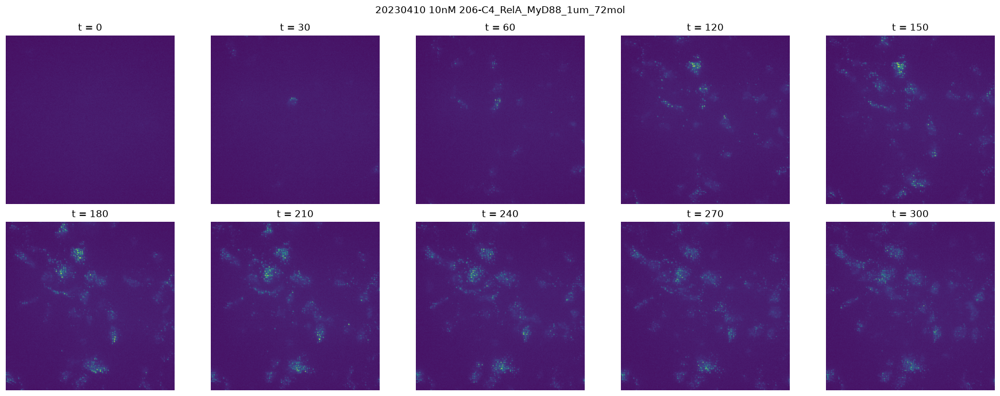

MoviePy - Building file 20230410 10nM 206-C4_RelA_MyD88_1um_72mol.gif with imageio.


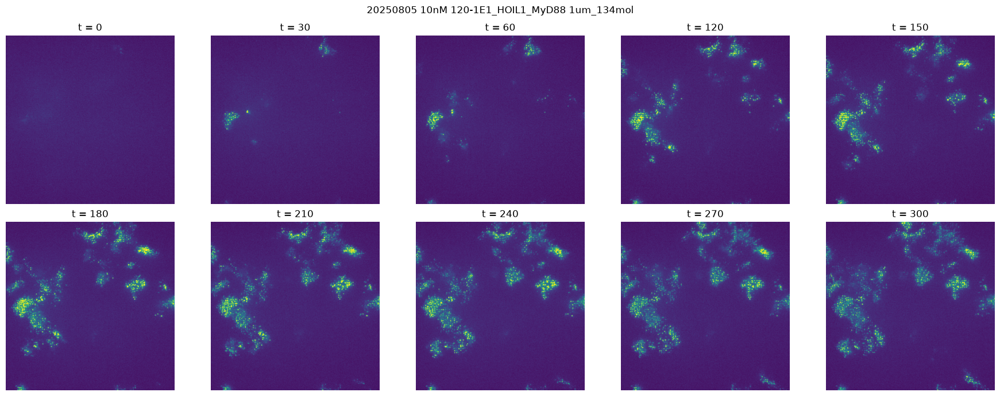

MoviePy - Building file 20250805 10nM 120-1E1_HOIL1_MyD88 1um_134mol.gif with imageio.


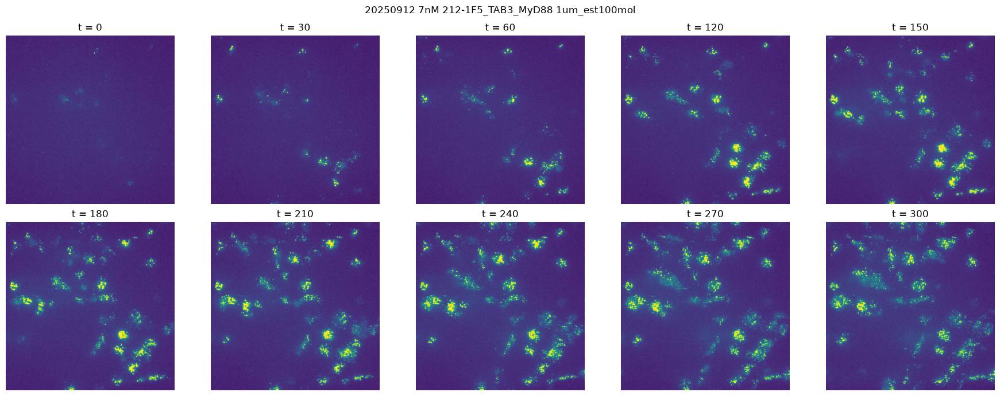

MoviePy - Building file 20250912 7nM 212-1F5_TAB3_MyD88 1um_est100mol.gif with imageio.


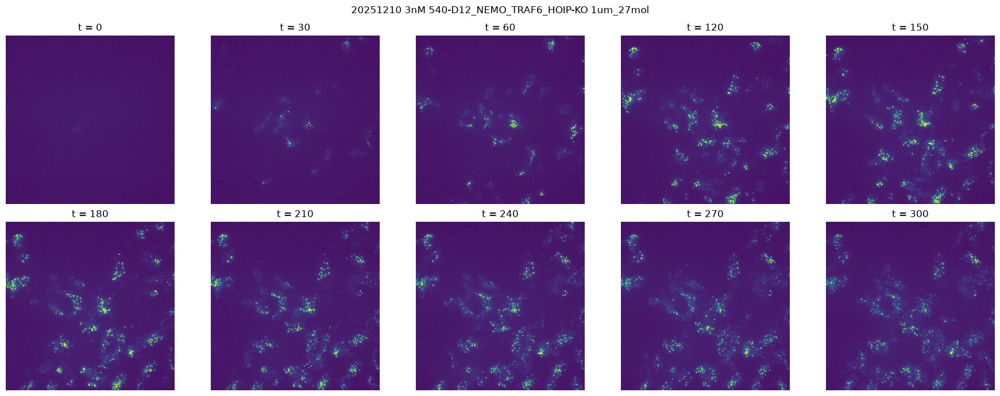

MoviePy - Building file 20251210 3nM 540-D12_NEMO_TRAF6_HOIP-KO 1um_27mol.gif with imageio.


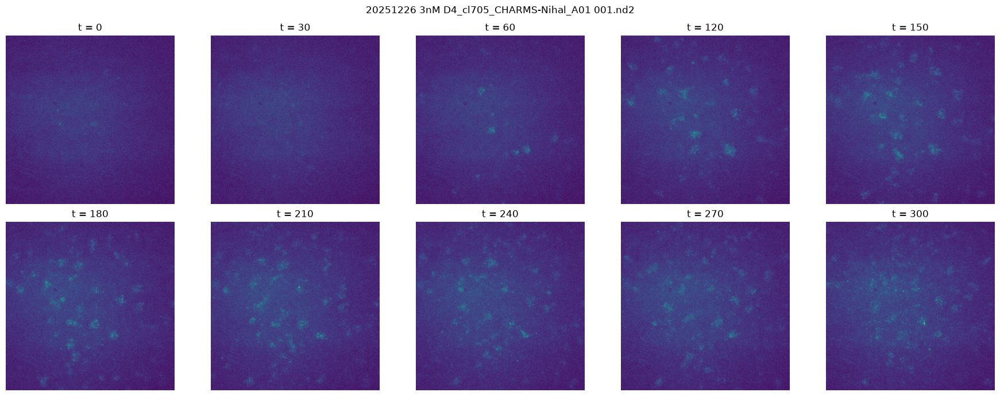

MoviePy - Building file 20251226 3nM D4_cl705_CHARMS-Nihal_A01 001.nd2.gif with imageio.


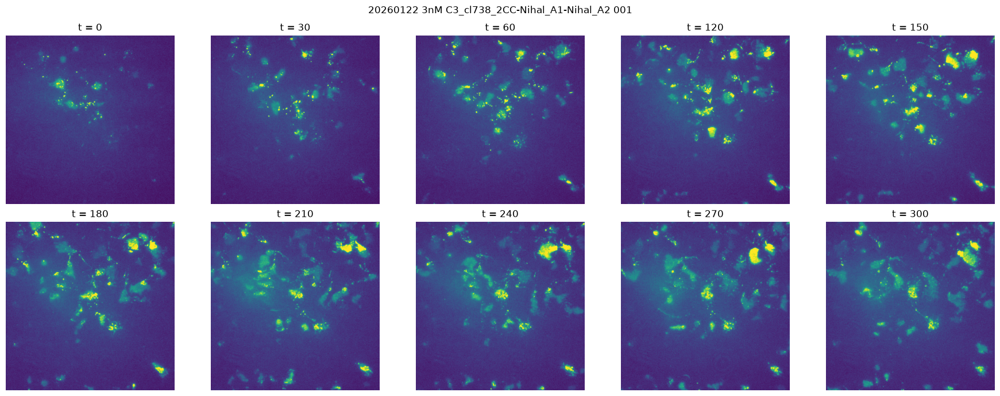

MoviePy - Building file 20260122 3nM C3_cl738_2CC-Nihal_A1-Nihal_A2 001.gif with imageio.


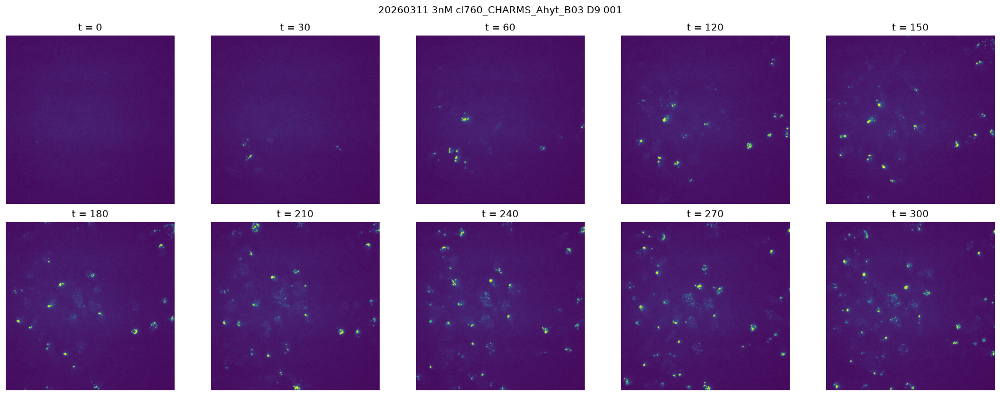

MoviePy - Building file 20260311 3nM cl760_CHARMS_Ahyt_B03 D9 001.gif with imageio.


In [25]:
frames = [0, 30, 60, 120, 150, 180, 210, 240, 270, 300]

for index in nd2_files.keys():
    fig, axes = plt.subplots(2, 5, figsize=(18, 7))
    for ax, t in zip(axes.flat, frames):

        processed_data = np.clip(nd2_files[index][:,1][t] - dark_60, 0, None)

        ax.imshow(
            processed_data,
            cmap="viridis",
            vmin=0,
            vmax= nd2_files[index].max()/150
        )

        ax.set_title(f"t = {t}")
        ax.axis("off")

    title = str(imagefolders[index]).split("/")[-1]

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

    # GIF
    raw_sequence = nd2_files[index][:, 1]
    processed_seq = np.clip(raw_sequence - dark_60, 0, None)
    vmax = nd2_files[index].max() / 150
    norm_seq = np.clip(processed_seq / vmax, 0, 1)
    cmap = plt.get_cmap("viridis")
    colored_seq = cmap(norm_seq)
    gif_frames = (colored_seq[..., :3] * 255).astype(np.uint8)

    ImageSequenceClip(list(gif_frames), fps=20).write_gif(f'{title}.gif', fps=10)
